# F_pupil_beh_ephys.ipynb

## Purpose
This notebook analyzes the relationship between pupil dilation dynamics and neural activity during the dynamic foraging task. It examines cross-correlations between pupil size and firing rates, identifies temporal dynamics of pupil-neural coupling, and relates these features to behavioral performance and neural response properties.

## Prerequisites
- `code/data_management/hopkins_session_assets.csv` — session list
- `{session}_unit_pupil_correlation_results.pickle` — per-session unit-level pupil cross-correlation and auto-correlation results (from ephys_processed_dir_curated)
- `{session}_pupil_lm_results.pkl` — per-session pupil linear model fits with T-statistics for behavioral regressors (from beh_fig_dir)
- `manuscript_fig_prep_dir/waveforms_tt/combined_features.csv` — waveform shape features per unit
- `manuscript_fig_prep_dir/basic_ephys/basic_ephys.pkl` — basic ephys metrics (firing rates, response properties, quality filters)
- `manuscript_fig_prep_dir/combined_unit_tbl/combined_unit_tbl.pkl` — combined unit table with CCF coordinates and quality flags
- `code/beh_ephys_analysis/session_combine/metrics/beh_all.json` and `beh_all_beh.json` — QC constraint definitions
- `manuscript_fig_prep_dir/outcome_regressions/model_combined_beh_all.csv` — outcome/value regression coefficients per unit
- `manuscript_fig_prep_dir/response_regression/response_ratio_beh_all_go_cue.csv` — go-cue response ratios per unit
- `manuscript_fig_prep_dir/combined_session_tbl/combined_beh_sessions.pkl` — session-level behavioral performance metrics

## Figure Panels
- **FigureE13d**: Distribution of pupil autocorrelation time constants (histogram of `decay_tau`)
- **FigureE13f**: Pupil regression t-statistics for response, outcome, switch and choice side (histogram of `choice_resp_outcome`, `choice_resp_svs`, `choice_resp_choice`, `all_bl_hit`)
- **FigureE13g_right**: Population spike-pupil cross-correlations (time series, `crosscorrelation_all_units`)
- **FigureE13h**: Peak cross-correlation values and lags (histogram of `peak_value`, `peak_lag`)
- **FigureE13j**: Baseline pupil-spike correlation coefficients (histogram of `baseline_corr`)
- **FigureE13l**: Peak pupil dilation correlation with baseline spike rate (histogram of `dilation_bl_corr`)
- **FigureE13n**: Peak pupil dilation correlation with go-cue response (histogram of `dilation_response_corr`)

## Imports and Setup

Load standard scientific Python libraries, project utilities (pupil, ephys, behavioral, plot functions), and resolve the `beh_ephys_analysis` root so imports work regardless of execution context.

In [1]:
# %%
import os
import sys
# Resolve code/beh_ephys_analysis (the folder containing `utils`) relative to this
# file's location, so imports work no matter where the repo is checked out.
import pathlib

# Resolve code/beh_ephys_analysis (the folder containing `utils`) relative to this
# file's location, so imports work no matter where the repo is checked out.
try:
    _here = pathlib.Path(__file__).resolve().parent          # script mode
except NameError:
    try:
        _here = pathlib.Path(__vsc_ipynb_file__).resolve().parent  # VS Code notebook
    except NameError:
        _here = pathlib.Path(os.getcwd())                    # other Jupyter fallback

_beh_ephys_root = str((_here / '../..').resolve())
if _beh_ephys_root not in sys.path:
    sys.path.insert(0, _beh_ephys_root)
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import json
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import re
from utils.beh_functions import parseSessionID, session_dirs, get_unit_tbl, get_session_tbl, makeSessionDF
from utils.ephys_functions import plot_rate, correlate_nan_bi, correlate_nan, load_drift, get_spike_matrix
from utils.lick_utils import load_licks
from utils.photometry_utils import bin_timeseries_around_align
from utils.pupil_utils import load_pupil
from utils.combine_tools import apply_qc, to_str_intlike
from utils.plot_utils import combine_pdf_big
from utils.capsule_migration import capsule_directories
from aind_ephys_utils import align
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colormaps
import pickle
import shutil
import datetime
import seaborn as sns
from trimesh import load_mesh
from aind_dynamic_foraging_data_utils.nwb_utils import load_nwb_from_filename
import numbers
from scipy.interpolate import interp1d
from scipy.stats import pearsonr
%matplotlib widget
capsule_dirs = capsule_directories()
from utils.capsule_migration import CAPSULE_ROOT
from utils.panel_utils import save_panels, save_panel_csv, columns_to_df, heatmap_to_df
from scipy.optimize import curve_fit
from scipy.stats import zscore
from sklearn.decomposition import PCA


## Data Loading and Initialization

Load pupil correlation results from individual sessions including cross-correlation and auto-correlation data. Extract T-statistics from pupil-behavior linear models that relate pupil dynamics to task variables (choice, outcome, stimulus value). Merge these behavioral model fits with unit-level pupil correlation metrics.

In [2]:
data_df = pd.read_csv(CAPSULE_ROOT + '/code/data_management/hopkins_session_assets.csv')
sessions = data_df['session_id'].values.tolist()

In [3]:
criteria_name = 'beh_all'
beh_criteria = 'beh_all_beh'
version = 'PrL_S1'

pupil_folder = os.path.join(capsule_dirs['manuscript_fig_dir'],'F_pupil')
if not os.path.exists(pupil_folder):
    os.makedirs(pupil_folder)

In [4]:
pupil_results = []
pupil_beh_fit = []
T_params_choice_resp = {'outcome': [1, 2.5],
                'svs': [0, 1.5],
                'choice': [0, 1.5],
                'choice:outcome': [1, 2.5]}
T_params_choice_bl = {'svs': [-2, 0]}
T_params_all_resp = {'hit': [0, 1.5]}
T_params_all_bl = {'hit': [-2, 0]}
all_params = {'choice_resp': T_params_choice_resp,
              'choice_bl': T_params_choice_bl,
              'all_resp': T_params_all_resp,
              'all_bl': T_params_all_bl}
for session in sessions:
    session_dir = session_dirs(session)
    pupil_file = os.path.join(session_dir['ephys_processed_dir_curated'], f'{session}_unit_pupil_correlation_results.pickle')
    curr_fit = {}
    if os.path.exists(pupil_file):
        with open(pupil_file, 'rb') as f:
            curr_pupil_data = pickle.load(f)
        pupil_results.append(curr_pupil_data)
    else:
        continue
        

    # pupil-beh fit
    pupil_model_file = os.path.join(session_dir['beh_fig_dir'], f'{session}_pupil_lm_results.pkl')
    if not os.path.exists(pupil_model_file):
        continue
    with open(pupil_model_file, 'rb') as f:
        curr_pupil_model_data = pickle.load(f)
    choice_fit = curr_pupil_model_data['lm_results']
    all_fit = curr_pupil_model_data['lm_results_all']

    # extract T statistics
    for model_type, params in all_params.items():
        if model_type == 'choice_resp':
            fit_data = choice_fit
        elif model_type == 'choice_bl':
            fit_data = choice_fit
        elif model_type == 'all_resp':
            fit_data = all_fit
        elif model_type == 'all_bl':
            fit_data = all_fit
        if fit_data is None:
            continue
        for param_name, time_window in params.items():
            time_vec = fit_data['time']
            time_mask = (time_vec >= time_window[0]) & (time_vec <= time_window[1])
            if fit_data['regressors'] is None:
                continue
            if param_name not in fit_data['regressors']:
                continue
            param_ind = fit_data['regressors'].index(param_name)
            t_stats = fit_data['TvCurrU'][:, param_ind]
            mean_t_stat = np.nanmean(t_stats[time_mask])
            max_t_stat_ind = np.nanargmax(np.abs(t_stats[time_mask]))
            max_t_stat = t_stats[time_mask][max_t_stat_ind]
            min_p = np.nanmin(fit_data['PvCurrU'][:, param_ind][time_mask])
            curr_fit[f'{model_type}_{param_name}'] = max_t_stat
            curr_fit[f'{model_type}_{param_name}_min_p'] = min_p
    curr_fit['session'] = session
    pupil_beh_fit.append(curr_fit)
            
pupil_df = pd.concat(pupil_results, ignore_index=True)
pupil_fit_df = pd.DataFrame(pupil_beh_fit)
pupil_df = pupil_df.merge(pupil_fit_df, on='session', how='left')

## Load Complementary Feature Sets

Import waveform features characterizing spike shape, basic ephys metrics (firing rates, response properties), unit metadata (location, quality), and behavioral constraints. These feature sets will be merged with pupil data to enable comprehensive multi-modal analysis.

In [5]:
# load waveforms
waveform_criteria = 'waveform_all'
waveform_type = '_raw'
wf_folder = os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'waveforms_tt')
wf_feature_file = os.path.join(wf_folder, 'combined_features.csv')
wf_features = pd.read_csv(wf_feature_file)
wf_features.rename(columns={'unit': 'unit_id'}, inplace=True)
wf_features['unit_id'] = wf_features['unit_id'].apply(to_str_intlike)
wf_features.drop(columns=['probe'], inplace=True, errors='ignore')

In [6]:
# load basic ephys
be_criteria = 'basic_ephys'
be_folder = os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'basic_ephys')
be_file = os.path.join(be_folder, 'basic_ephys.pkl')
with open(be_file, 'rb') as f:
    basic_ephys_df = pickle.load(f)
filter = basic_ephys_df['be_filter'].values
filter = np.array(filter, dtype=bool)
basic_ephys_df['be_filter'] = filter
basic_ephys_df.rename(columns={'unit': 'unit_id'}, inplace=True)
basic_ephys_df['unit_id'] = basic_ephys_df['unit_id'].apply(to_str_intlike)

In [7]:
# load basic constraints and data (unit + behavior)
with open(os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'combined_unit_tbl', 'combined_unit_tbl.pkl'), 'rb') as f:
    combined_tagged_units = pickle.load(f)
combined_tagged_units.rename(columns={'unit': 'unit_id'}, inplace=True)
combined_tagged_units['unit_id'] = combined_tagged_units['unit_id'].apply(to_str_intlike)

with open(os.path.join(CAPSULE_ROOT + '/code/beh_ephys_analysis/session_combine/metrics', f'{criteria_name}.json'), 'r') as f:
    constraints = json.load(f)
with open(os.path.join(CAPSULE_ROOT + '/code/beh_ephys_analysis/session_combine/metrics', f'{beh_criteria}.json'), 'r') as f:
    beh_constraints = json.load(f)

# start with a mask of all True
mask = pd.Series(True, index=combined_tagged_units.index)
beh_folder = os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'outcome_regressions')

Applying conditional bounds for isi_violations
 - isi_violations: 15278 -> 6733 units passed
Applying items for qc_pass: [True]
 - qc_pass: 6733 -> 4493 units passed
Applying bounds for peak: [-1000, 500]
 - peak: 4493 -> 4470 units passed
Applying items for in_df: [True]
 - in_df: 4470 -> 4235 units passed
Applying conditional bounds for y_loc
 - y_loc: 4235 -> 2971 units passed
Applying bounds for trial_count: [100, 2000]
 - trial_count: 2971 -> 2958 units passed
Applying bounds for sd: [0, 0.3]
 - sd: 2958 -> 1362 units passed
Applying opto conditions: ['p_max', 'eu', 'corr', 'tag_loc', 'lat_max_p', 'p_mean', 'sig_counts']
Number of opto rows after filtering: 294
Number of non-opto rows after filtering: 1362


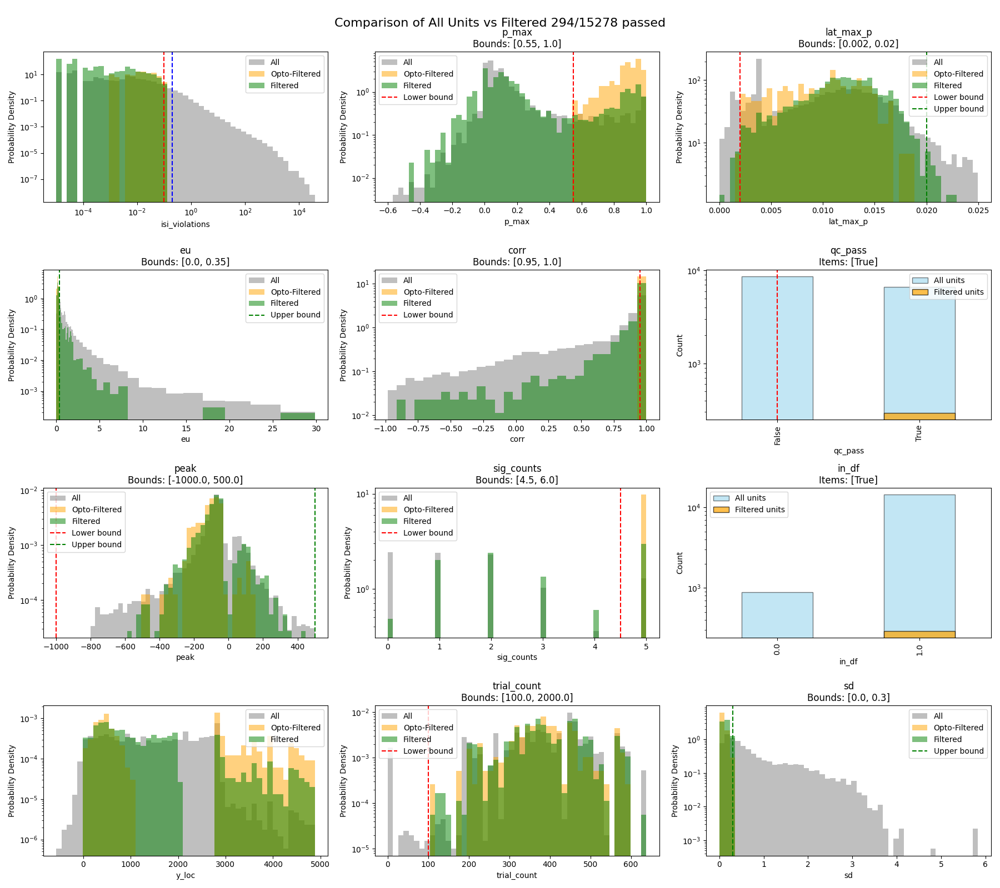

In [8]:
with open(os.path.join(CAPSULE_ROOT + '/code/beh_ephys_analysis/session_combine/metrics', f'{criteria_name}.json'), 'r') as f:
    constraints = json.load(f)
if 'tier_2' not in combined_tagged_units.columns:
    combined_tagged_units['tier_2'] = False
if 'tier_1' not in combined_tagged_units.columns:
    combined_tagged_units['tier_1'] = False
combined_tagged_units_filtered, combined_tagged_units, fig, axes = apply_qc(combined_tagged_units, constraints)
combined_tagged_units.rename(columns={'unit': 'unit_id'}, inplace=True)
combined_tagged_units['unit_id'] = combined_tagged_units['unit_id'].apply(to_str_intlike)
combined_tagged_units_filtered.rename(columns={'unit': 'unit_id'}, inplace=True)
combined_tagged_units_filtered['unit_id'] = combined_tagged_units_filtered['unit_id'].apply(to_str_intlike)

## Merge Features and Apply Quality Filters

Combine behavioral model parameters describing outcome and value encoding with pupil data. Add theta parameters that capture the balance between outcome and value coding. Merge all feature sets (pupil, waveforms, basic ephys, response ratios, session behavior) into a unified dataframe.

In [9]:
# load and add model variables
model_combined = pd.read_csv(os.path.join(beh_folder, f'model_combined_{criteria_name}.csv'), index_col=0)
model_combined['theta'] = model_combined['theta'] - 0.5
model_combined['unit_id'] = model_combined['unit_id'].apply(to_str_intlike)

versions = ['e', 'l', 'com']
for version in versions:
    all_vec = np.column_stack((
        model_combined[f'coef_outcome_{version}_mc'],
        model_combined[f'coef_Qchosen_{version}_ori']
    ))
    theta, rho = np.arctan2(all_vec[:, 1], all_vec[:, 0]), np.hypot(all_vec[:, 1], all_vec[:, 0])
    bound_1, bound_2, bound_3 = -(1 / 4) * np.pi, np.pi, -np.pi
    theta_scaled_dis = np.zeros_like(theta)
    for ind, angle_curr in enumerate(theta):
        if bound_1 < angle_curr <= bound_2:
            theta_scaled_dis[ind] = (angle_curr - bound_1) / (bound_2 - bound_1)
        else:
            theta_scaled_dis[ind] = (bound_1 - angle_curr) / (bound_1 - bound_3)
    theta_scaled_dis_all = 1 - theta_scaled_dis - 0.5
    model_combined[f'theta_{version}'] = theta_scaled_dis_all

# derived features
model_combined['coef_outcome|(|coef_outcome| + |coef_Q|)'] = (
    model_combined['coef_outcome_com_mc'] /
    (np.abs(model_combined['coef_outcome_com_mc']) + np.abs(model_combined['coef_Qchosen_com_mc']))
)
model_combined['outcome_ipsi'] = (
    model_combined['coef_outcome_com_mc'] + model_combined['coef_outcome:ipsi_com_mc']
)
model_combined['outcome_contra'] = (
    model_combined['coef_outcome_com_mc'] - model_combined['coef_outcome:ipsi_com_mc']
)

In [10]:
pupil_df.rename(columns={'unit': 'unit_id'}, inplace=True)

In [11]:
# Combine all features
features_combined = pupil_df.merge(model_combined, on=['session', 'unit_id'], suffixes=('', '_pupil'), how='left')
features_combined = pd.merge(features_combined, wf_features, on=['session', 'unit_id'], suffixes=('', '_wf'), how='left')
features_combined = pd.merge(features_combined, basic_ephys_df, on=['session', 'unit_id'], suffixes=('', '_be'), how='left')
response_tbl = pd.read_csv(
    os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'response_regression', f'response_ratio_{criteria_name}_go_cue.csv')
)
response_tbl['unit_id'] = response_tbl['unit'].apply(to_str_intlike)
features_combined = features_combined.merge(response_tbl, on=['session', 'unit_id'], how='left')

features_combined = features_combined.merge(combined_tagged_units_filtered[['session', 'unit_id', 'x_ccf', 'y_ccf', 'z_ccf', 'isi_violations', 'y_loc', 'sd']], on=['session', 'unit_id'], how='inner')
features_combined['be_filter'] = (features_combined['be_filter'].fillna(False).astype(bool))
features_combined['be_filter'] = features_combined['be_filter'] & (features_combined['error_prop']<=0.25)

/tmp/ipykernel_1797175/560602445.py:12: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  features_combined['be_filter'] = (features_combined['be_filter'].fillna(False).astype(bool))


In [12]:
behavior_file = os.path.join(capsule_dirs["manuscript_fig_prep_dir"], 'combined_session_tbl', 'combined_beh_sessions.pkl')
with open(behavior_file, 'rb') as f:
    combined_beh_sessions = pickle.load(f)
features_combined = features_combined.merge(combined_beh_sessions, on='session', how='left')

In [13]:
# pull all pupil data into one folder
data_df = pd.read_csv(CAPSULE_ROOT + '/code/data_management/hopkins_session_assets.csv')
sessions = data_df['session_id'].values.tolist()
target_folder = os.path.join(pupil_folder, 'all_sessions')
if not os.path.exists(target_folder):
    os.makedirs(target_folder)
for session in sessions:
    session_dir = session_dirs(session)
    pupil_file = os.path.join(session_dir['beh_fig_dir'], f'{session}_pupil_analysis.pdf')
    if os.path.exists(pupil_file):
        dest_file = os.path.join(target_folder, f'{session}_pupil_analysis.pdf')
        shutil.copyfile(pupil_file, dest_file)

## Cross-Correlation Analysis

Extract and analyze spike-pupil cross-correlation functions to identify temporal relationships between neural activity and pupil dynamics. Compare correlations computed with trial event regressors versus without to distinguish task-related from intrinsic coupling. Identify peak lag times and correlation magnitudes, and fit exponential decay functions to characterize the timescale of spike-pupil coupling.

In [14]:
cross_list = features_combined['crosscorr_with_trials']
cross_list_no_trial = features_combined['crosscorr_no_trials']
valid_mask = features_combined['crosscorr_with_trials'].isna() == False
valid_mask = valid_mask & (features_combined['be_filter'].values)
valid_idx = np.where(valid_mask)[0]
m = len(cross_list[valid_idx[0]])

cross_mat = np.full((len(cross_list), m), np.nan)
cross_mat_no_trial = np.full((len(cross_list), m), np.nan)
for i in valid_idx:
    cross_mat[i] = np.array(cross_list[i]) - cross_list[i][0]
    cross_mat_no_trial[i] = np.array(cross_list_no_trial[i]) - cross_list_no_trial[i][0]
lag_time = features_combined['crosscorr_lags'].values[valid_idx[0]]

['/root/capsule/scratch/results/manuscript/figures/F_pupil/FigureS16g_right_crosscorrelation_all_units_beh_all_with_trial.csv']

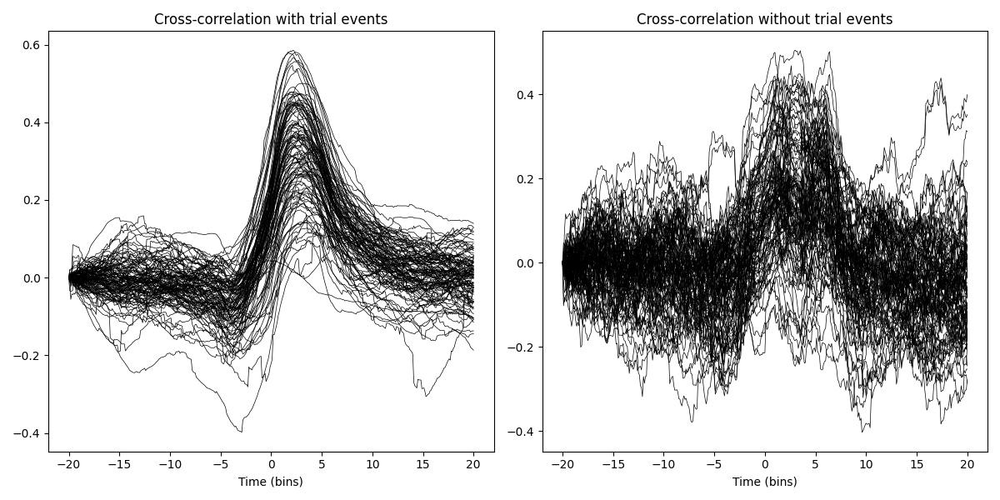

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
im = axes[0].plot(lag_time, cross_mat.T, color='k', linewidth=0.5)
axes[0].set_title('Cross-correlation with trial events')
axes[0].set_xlabel('Time (bins)')

im = axes[1].plot(lag_time, cross_mat_no_trial.T, color='k', linewidth=0.5)
axes[1].set_title('Cross-correlation without trial events')
axes[1].set_xlabel('Time (bins)')
plt.tight_layout()
save_panels(fig, pupil_folder, f'crosscorrelation_all_units_{criteria_name}', ['FigureE13g_right'], exts=('pdf', 'svg'))
# ---- panel CSV (rule 3: time series, one column per unit's cross-correlation) ----
_name = f'crosscorrelation_all_units_{criteria_name}'
_c1 = {'lag_time': np.asarray(lag_time)}
for _i in range(cross_mat.shape[0]):
    _c1[f'unit_{_i}'] = cross_mat[_i]
save_panel_csv(columns_to_df(**_c1), pupil_folder, _name, ['FigureE13g_right'], plot_type='with_trial')
##FigureE13g_right##

In [16]:
# find peak time and value for each unit
peak_lag = np.full(len(cross_list), np.nan)
peak_value = np.full(len(cross_list), np.nan)
for i in valid_idx:
    cross_curr = cross_mat[i]
    peak_idx = np.argmax(cross_curr)
    peak_lag[i] = lag_time[peak_idx]
    peak_value[i] = cross_curr[peak_idx]
features_combined['peak_lag'] = peak_lag
features_combined['peak_value'] = peak_value

# do same for no trial
peak_lag_no_trial = np.full(len(cross_list_no_trial), np.nan)
peak_value_no_trial = np.full(len(cross_list_no_trial), np.nan)
for i in valid_idx:
    cross_curr = cross_mat_no_trial[i]
    peak_idx = np.argmax(cross_curr)
    peak_lag_no_trial[i] = lag_time[peak_idx]
    peak_value_no_trial[i] = cross_curr[peak_idx]
features_combined['peak_lag_no_trial'] = peak_lag_no_trial
features_combined['peak_value_no_trial'] = peak_value_no_trial

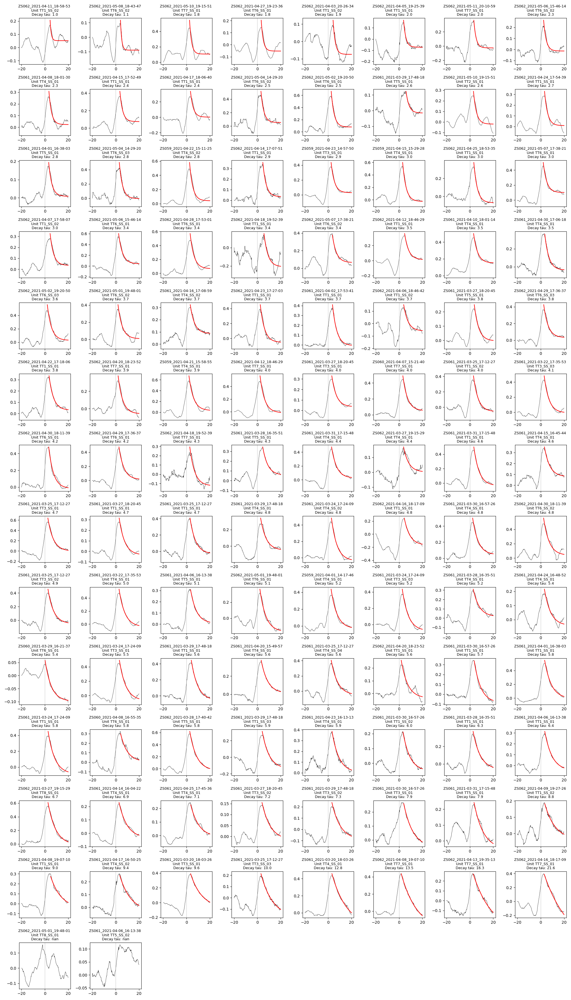

In [17]:
# Fit exponential decay to post-peak period: y = A * exp(-t/tau) + C
def exp_decay(x, A, tau, C):
    return A * np.exp(-x / tau) + C

n = len(cross_list)
decay_tau = np.full(n, np.nan)

# store fitted curves aligned to cross_mat rows (NaN when not available)
cross_mat_fitted = np.full_like(cross_mat, np.nan, dtype=float)

# store peak indices (optional, but handy for plotting)
peak_idx_arr = np.full(n, -1, dtype=int)

for i in valid_idx:
    cross_curr = np.asarray(cross_mat[i], dtype=float)

    if cross_curr.size == 0 or not np.any(np.isfinite(cross_curr)):
        continue

    peak_idx = int(np.nanargmax(cross_curr))
    peak_idx_arr[i] = peak_idx

    start = peak_idx + 4
    if start >= len(lag_time) or start >= len(cross_curr):
        continue  # no post-peak region

    post_peak_time = np.asarray(lag_time[start:], dtype=float)
    post_peak_values = np.asarray(cross_curr[start:], dtype=float)

    mask = np.isfinite(post_peak_time) & np.isfinite(post_peak_values)
    x = post_peak_time[mask]
    y = post_peak_values[mask]

    if x.size < 3:
        continue  # not enough points to fit

    # initial guess
    A0 = y[0] - y[-1]
    tau0 = 100.0
    C0 = y[-1]
    p0 = (A0, tau0, C0)

    # bounds: tau must be positive; allow A to be +/-; C free
    bounds = ([-np.inf, 1e-6, -np.inf], [np.inf, np.inf, np.inf])

    try:
        popt, _ = curve_fit(exp_decay, x, y, p0=p0, bounds=bounds, maxfev=20000)
        decay_tau[i] = popt[1]
        if np.abs(decay_tau[i]) > 1000:
            decay_tau[i] = np.nan

        # generate fitted curve on the full post-peak time vector (not just masked points)
        fit_full = exp_decay(post_peak_time, *popt)
        cross_mat_fitted[i, start:start + fit_full.size] = fit_full

    except Exception:
        continue

# --- visualize fits ---
valid_tau = decay_tau[valid_idx]
sorted_local = np.argsort(valid_tau)  # indices within valid_idx (NaNs go last if any)

n_units = len(valid_idx)
n_cols = 8
n_rows = int(np.ceil(n_units / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 2.5 * n_rows))
axes = np.atleast_1d(axes).ravel()

for plot_idx, local in enumerate(sorted_local):
    i = valid_idx[local]
    ax = axes[plot_idx]

    cross_curr = cross_mat[i]
    ax.plot(lag_time, cross_curr, color='k', linewidth=0.5)

    # overlay fitted curve where available
    if np.isfinite(decay_tau[i]):
        ax.plot(lag_time, cross_mat_fitted[i], color='r', linewidth=1.5)

    unit_id = features_combined["unit_id"].values[i] if "unit_id" in features_combined.columns else i
    session = features_combined["session"].values[i] if "session" in features_combined.columns else 'N/A'
    ax.set_title(f'{session[9:]} \nUnit {unit_id}\nDecay tau: {decay_tau[i]:.1f}', fontsize=9)
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.5)

# turn off unused axes
for k in range(n_units, n_rows * n_cols):
    axes[k].axis("off")

plt.tight_layout()

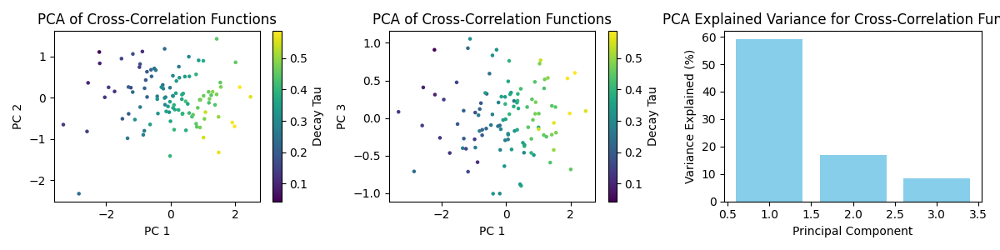

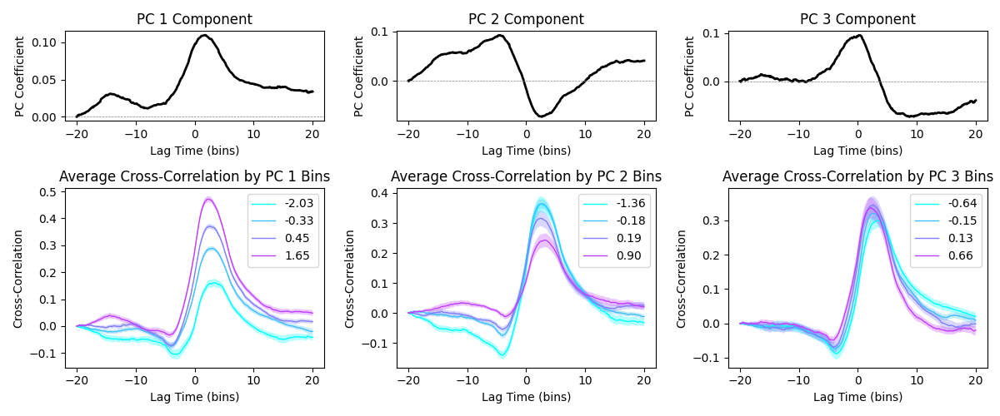

In [18]:
# pcs on crosscorr
valid_cross = cross_mat[valid_idx]
pca = PCA(n_components=3)
pca.fit(valid_cross)
pcs = pca.transform(valid_cross)
fig = plt.figure(figsize=(12, 3))
ax = fig.add_subplot(131)
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=peak_value[valid_idx], cmap='viridis', s=5)
plt.colorbar(sc, ax=ax, label='Decay Tau')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_title('PCA of Cross-Correlation Functions')
ax = fig.add_subplot(132)
sc = ax.scatter(pcs[:, 0], pcs[:, 2], c=peak_value[valid_idx], cmap='viridis', s=5)
plt.colorbar(sc, ax=ax, label='Decay Tau')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 3')
ax.set_title('PCA of Cross-Correlation Functions')
plt.tight_layout()

# exmplain power
explained_variance = pca.explained_variance_ratio_ * 100  # percentage
ax = fig.add_subplot(133)
ax.bar(range(1, len(explained_variance) + 1), explained_variance, color='skyblue')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Variance Explained (%)')
ax.set_title('PCA Explained Variance for Cross-Correlation Functions')
plt.tight_layout()

# bin cross_corr by pc1 - pc3 and plot average crosscorr
pc_bins = 4
fig, axes = plt.subplots(2, 3, figsize=(12, 5), height_ratios=[0.5, 1])
for pc_idx in range(3):
    pc_values = pcs[:, pc_idx]
    bin_edges = np.percentile(pc_values, np.linspace(0, 100, pc_bins + 1))
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    # plot pc coeficients
    axes[0, pc_idx].plot(lag_time, pca.components_[pc_idx], color='k', linewidth=2)
    axes[0, pc_idx].set_title(f'PC {pc_idx + 1} Component')
    axes[0, pc_idx].set_xlabel('Lag Time (bins)')
    axes[0, pc_idx].set_ylabel('PC Coefficient')
    axes[0, pc_idx].axhline(0, color='gray', linestyle='--', linewidth=0.5)
    for b in range(pc_bins):
        bin_mask = (pc_values >= bin_edges[b]) & (pc_values < bin_edges[b + 1])
        if np.sum(bin_mask) == 0:
            continue
        mean_crosscorr = np.nanmean(valid_cross[bin_mask], axis=0)
        sem_crosscorr = np.nanstd(valid_cross[bin_mask], axis=0) / np.sqrt(np.sum(bin_mask))
        axes[1, pc_idx].plot(lag_time, mean_crosscorr, label=f'{bin_centers[b]:.2f}', color = colormaps['cool'](b / pc_bins), linewidth=1)
        axes[1, pc_idx].fill_between(lag_time, mean_crosscorr - sem_crosscorr, mean_crosscorr + sem_crosscorr, alpha=0.3, facecolor=colormaps['cool'](b / pc_bins))

    axes[1, pc_idx].set_title(f'Average Cross-Correlation by PC {pc_idx + 1} Bins')
    axes[1, pc_idx].set_xlabel('Lag Time (bins)')
    axes[1, pc_idx].set_ylabel('Cross-Correlation')
    axes[1, pc_idx].legend()
plt.tight_layout()

features_combined['decay_tau_cross'] = decay_tau
features_combined.loc[:, 'cross_pc_1'] = np.nan
features_combined.loc[:, 'cross_pc_2'] = np.nan
features_combined.loc[valid_idx, 'cross_pc_1'] = pcs[:, 0]
features_combined.loc[valid_idx, 'cross_pc_2'] = pcs[:, 1]

## Pupil Auto-Correlation and Temporal Dynamics

Examine pupil auto-correlation structure to characterize intrinsic timescales of pupil fluctuations independent of neural activity. Fit exponential decay functions to quantify temporal persistence (decay tau). Generate visualizations showing the diversity of pupil dynamics across units, and perform PCA on cross-correlation functions to identify principal modes of spike-pupil coupling.

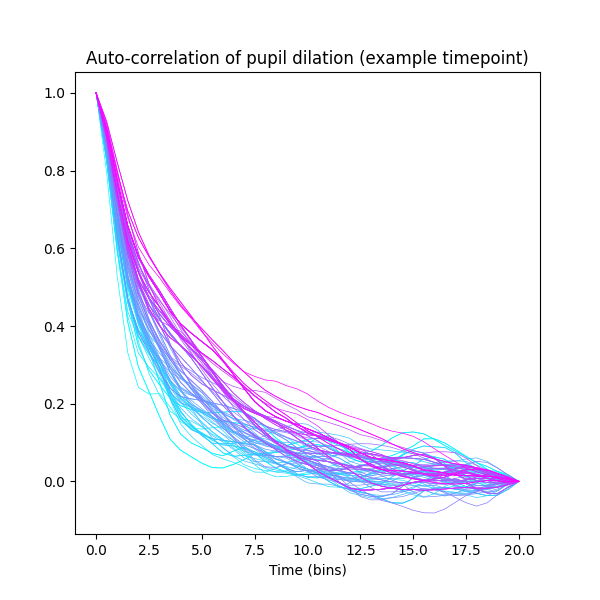

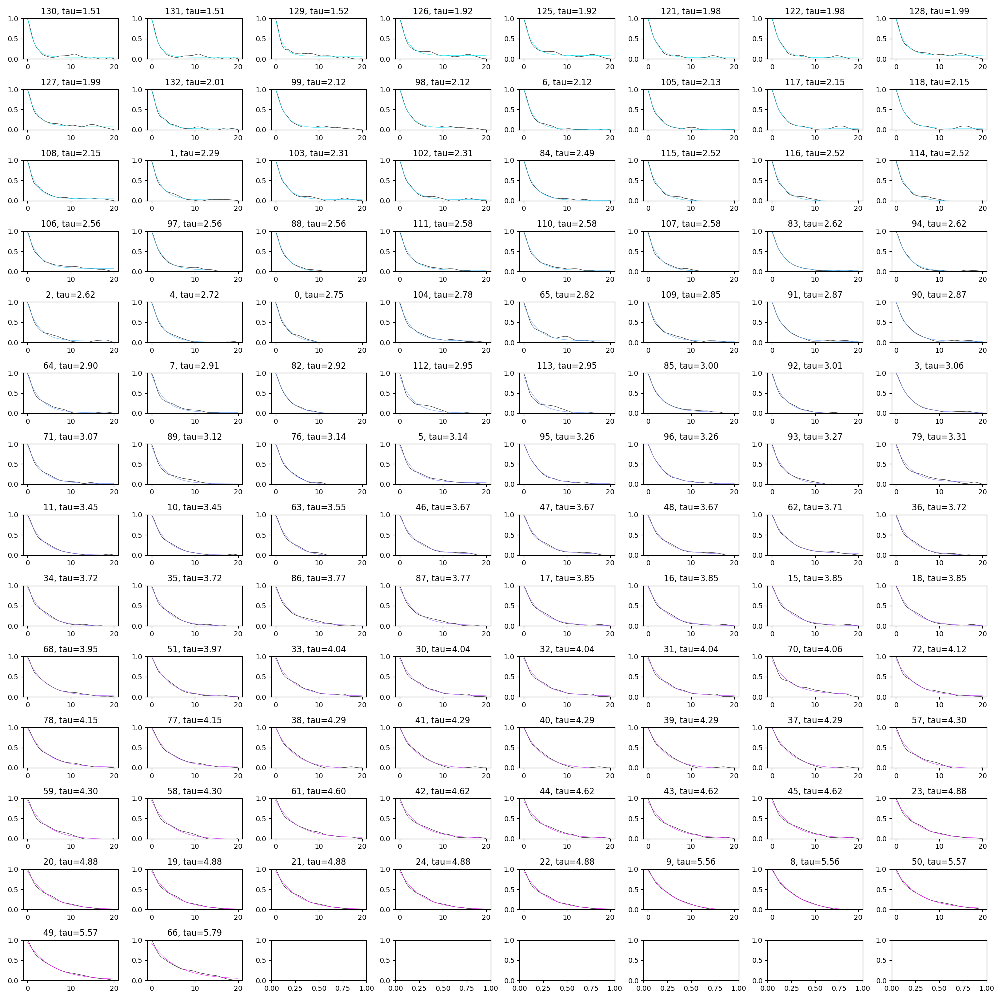

In [19]:
# auto-corr structure
auto_list = features_combined['auto_corr_pupil_with_trials']
valid_mask_auto = features_combined['auto_corr_pupil_with_trials'].isna() == False
valid_mask_auto = valid_mask_auto & (features_combined['be_filter'].values)
valid_idx_auto = np.where(valid_mask_auto)[0]
m_auto = len(auto_list[valid_idx_auto[0]])
auto_mat = np.full((len(auto_list), m_auto), np.nan)
for i in valid_idx_auto:
    auto_mat[i] = (np.array(auto_list[i]) - auto_list[i][-1])/(1-auto_list[i][-1])  # normalize to 0 at lag 0
lag_time_auto = features_combined['auto_corr_pupil_lags'].values[valid_idx_auto[0]]

# fit exponential decay to auto-corr: y = A * exp(-x/tau) + C
decay_tau = np.full(len(auto_list), np.nan)

auto_mat_fitted = np.full_like(auto_mat, np.nan)
for i in valid_idx_auto:
    auto_curr = auto_mat[i]
    # find peaks
    decay_x = lag_time_auto
    decay_y = auto_curr
    # fit exponential decay
    # initial guess
    A0 = decay_y[0] - decay_y[-1]
    tau0 = 10
    C0 = decay_y[-1]
    p0 = [A0, tau0, C0]
    bounds = ([0, 0, -np.inf], [np.inf, np.inf, np.inf])
    popt, pcov = curve_fit(exp_decay, decay_x, decay_y, p0=p0, bounds=bounds)
    decay_tau[i] = popt[1]

    auto_mat_fitted[i] = exp_decay(decay_x, *popt)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# plot by sorted decay tau use color map cool
sorted_idx = np.argsort(decay_tau[valid_idx_auto])

cmap = plt.get_cmap('cool')
for rank, idx in enumerate(sorted_idx):
    unit_idx = valid_idx_auto[idx]
    color = cmap(rank / len(sorted_idx))
    ax.plot(lag_time_auto, auto_mat[unit_idx], color=color, linewidth=0.5)
ax.set_title('Auto-correlation of pupil dilation (example timepoint)')
ax.set_xlabel('Time (bins)')

# plot fitted curves one by one, 8 in a row
fig, axes = plt.subplots(int(np.ceil(len(sorted_idx)/8)), 8, figsize=(20, 20))

for rank, idx in enumerate(sorted_idx):
    unit_idx = valid_idx_auto[idx]
    row = rank // 8
    col = rank % 8
    ax = axes[row, col]
    ax.plot(lag_time_auto, auto_mat[unit_idx], color='k', linewidth=0.5)
    ax.plot(lag_time_auto, auto_mat_fitted[unit_idx], color=cmap(rank / len(sorted_idx)), linewidth=0.5)
    ax.set_ylim([0, 1])
    ax.set_title(f'{unit_idx}, tau={decay_tau[unit_idx]:.2f}')
plt.tight_layout()

features_combined['decay_tau'] = decay_tau
fig.savefig(fname = os.path.join(pupil_folder, 'all_decay.pdf'))

['/root/capsule/scratch/results/manuscript/figures/F_pupil/FigureS16n_pupil_ephys_summary_histograms_beh_all.csv']

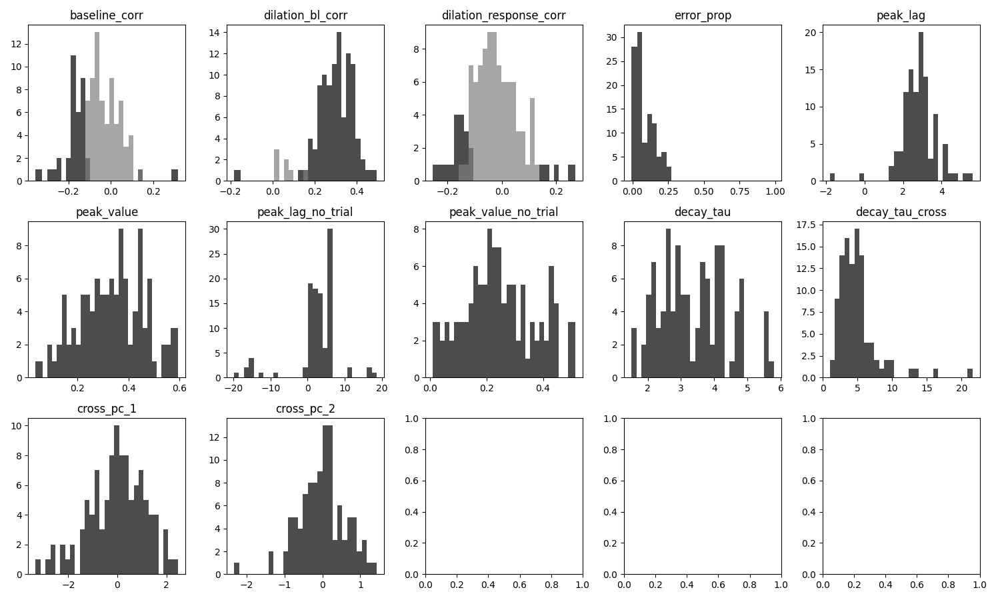

In [20]:
col_to_hist = ['baseline_corr', 'dilation_bl_corr', 'dilation_response_corr', 'error_prop', 'peak_lag', 'peak_value', 'peak_lag_no_trial', 'peak_value_no_trial','decay_tau', 'decay_tau_cross', 'cross_pc_1', 'cross_pc_2']
fig, axes = plt.subplots(int(np.ceil(len(col_to_hist)/5)), 5, figsize=(3 * 5, 3 * int(np.ceil(len(col_to_hist)/5))))
mask = features_combined['error_prop'] <= 0.25
for i, col in enumerate(col_to_hist):
    mask_col = col.split('_corr')[0] + '_p_sig'
    edges = np.linspace(np.nanmin(features_combined[col].dropna().values), np.nanmax(features_combined[col].dropna().values), 30)
    edges[-1] += 0.01
    edges[0] -= 0.01
    row = i // 5
    col_idx = i % 5
    ax = axes[row, col_idx]
    if mask_col in features_combined.columns:
        sig_mask = features_combined[mask_col] < 0.05
        ax.hist(features_combined.loc[sig_mask&mask, col].dropna(), bins=edges, alpha=0.7, label='p < 0.05', facecolor = 'k')
        ax.hist(features_combined.loc[~sig_mask&mask, col].dropna(), bins=edges, alpha=0.7, label='p >= 0.05', facecolor = 'gray')
    else:
        ax.hist(features_combined.loc[mask, col].dropna(), bins=edges, facecolor = 'k', alpha=0.7)
    ax.set_title(col)
plt.tight_layout()
save_panels(fig, pupil_folder, f'pupil_ephys_summary_histograms_{criteria_name}', ['FigureE13d', 'FigureE13h', 'FigureE13j', 'FigureE13l', 'FigureE13n'], exts=('pdf', 'svg'))
# ---- panel CSVs (rule 8 histogram: raw values per series; rule 9 mapping via JSON) ----
_mask_s = features_combined['error_prop'] <= 0.25
def _hist_cols(col):
    _mc = col.split('_corr')[0] + '_p_sig'
    if _mc in features_combined.columns:
        _sig = features_combined[_mc] < 0.05
        return {f'{col}_sig': features_combined.loc[_sig & _mask_s, col].dropna().values,
                f'{col}_nonsig': features_combined.loc[~_sig & _mask_s, col].dropna().values}
    return {col: features_combined.loc[_mask_s, col].dropna().values}
_name = f'pupil_ephys_summary_histograms_{criteria_name}'
save_panel_csv(columns_to_df(**_hist_cols('decay_tau')), pupil_folder, _name, ['FigureE13d'])
save_panel_csv(columns_to_df(**{**_hist_cols('peak_value'), **_hist_cols('peak_lag')}), pupil_folder, _name, ['FigureE13h'])
save_panel_csv(columns_to_df(**_hist_cols('baseline_corr')), pupil_folder, _name, ['FigureE13j'])
save_panel_csv(columns_to_df(**_hist_cols('dilation_bl_corr')), pupil_folder, _name, ['FigureE13l'])
save_panel_csv(columns_to_df(**_hist_cols('dilation_response_corr')), pupil_folder, _name, ['FigureE13n'])
##FigureE13d##
##FigureE13h##
##FigureE13j##
##FigureE13l##
##FigureE13n##

In [21]:
features_combined['decay_tau'].describe()

count    106.000000
mean       3.367674
std        1.026791
min        1.509711
25%        2.566323
50%        3.260708
75%        4.100493
max        5.790580
Name: decay_tau, dtype: float64

## Compare Pupil Features with Behavioral Performance

Relate pupil-spike coupling features (baseline correlation, dilation correlations, peak lag, peak value, decay timescales, cross-correlation PCs) to session-level behavioral metrics. Test whether pupil dynamics correlate with task engagement, choice bias, performance, or model-derived parameters. Analyze both unit-level and session-aggregated relationships.

In [22]:
pupil_model_params_to_check = pupil_fit_df.columns.tolist()
pupil_model_params_to_check.remove('session')

In [23]:
beh_cols = combined_beh_sessions.columns
beh_cols = beh_cols.to_list()
remove_cols = ['coeff_reward', 'ci-bands_reward','coeff_no-reward','ci-bands_no-reward','session','reward','model_name','session_id','probe','lick_bias', 'animal_id', 'model_name', 'ani_id']
for col in remove_cols:
    if col in beh_cols:
        beh_cols.remove(col)

In [24]:
print(pupil_df.columns.tolist())

['unit_id', 'session', 'corr_baseline', 'p_sig', 'crosscorr_with_trials', 'crosscorr_no_trials', 'crosscorr_lags', 'auto_corr_pupil_with_trials', 'auto_corr_pupil_no_trials', 'auto_corr_pupil_lags', 'baseline_corr', 'baseline_p_sig', 'dilation_bl_corr', 'dilation_bl_p_sig', 'dilation_response_corr', 'dilation_response_p_sig', 'error_prop', 'choice_resp_outcome', 'choice_resp_outcome_min_p', 'choice_resp_svs', 'choice_resp_svs_min_p', 'choice_resp_choice', 'choice_resp_choice_min_p', 'choice_resp_choice:outcome', 'choice_resp_choice:outcome_min_p', 'choice_bl_svs', 'choice_bl_svs_min_p', 'all_resp_hit', 'all_resp_hit_min_p', 'all_bl_hit', 'all_bl_hit_min_p']


## Compare Pupil Features with Task Response Encoding

Investigate whether neurons with stronger pupil coupling show distinct patterns of behavioral variable encoding. Test for correlations between pupil features and regression coefficients for outcome, value (Q-chosen), choice, and derived metrics like theta (outcome/value balance). Assess whether pupil dynamics relate to trial-evoked response properties.

In [25]:
session_features_combined = features_combined[beh_cols + pupil_model_params_to_check + ['session', 'ani_id']].groupby('session').first().reset_index()
pupil_model_params_to_check = [col for col in pupil_model_params_to_check if 'min_p' not in col]

In [26]:
pupil_model_params_to_check = ['choice_resp_outcome',
                                'choice_resp_svs',
                                'choice_resp_choice',
                                'all_bl_hit']

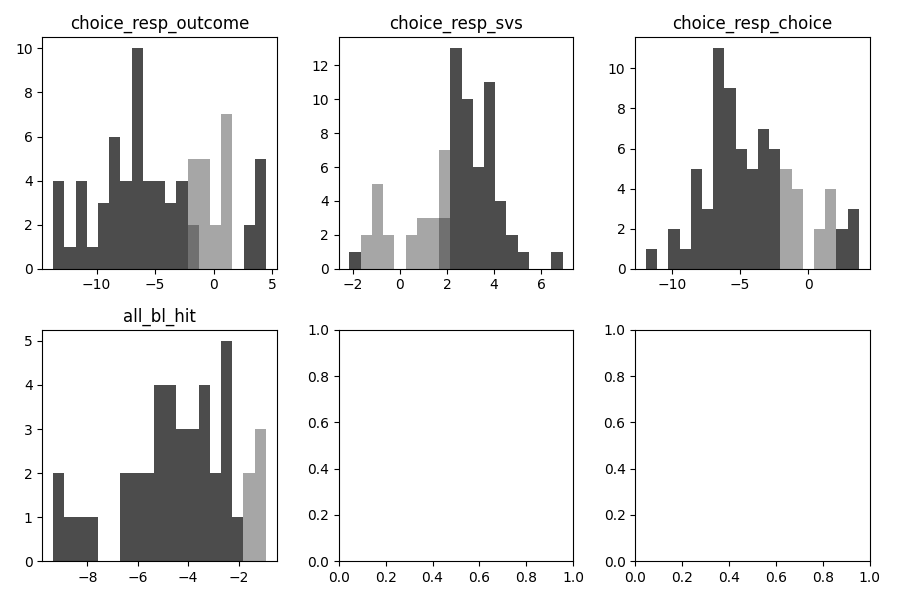

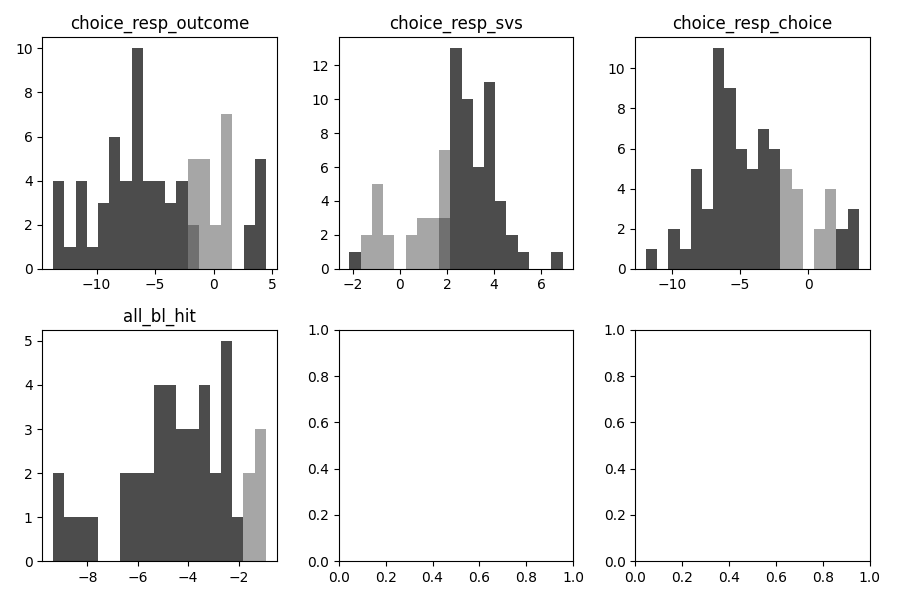

In [27]:
# histogram all cols in pupil_model_params_to_check
fig, axes = plt.subplots(int(np.ceil(len(pupil_model_params_to_check)/3)), 3, figsize=(3 * 3, 3 * int(np.ceil(len(pupil_model_params_to_check)/3))))
for feature_ind, feature in enumerate(pupil_model_params_to_check):
    ax = axes[feature_ind // 3, feature_ind % 3]
    data = session_features_combined[feature].dropna()
    edges = np.linspace(np.nanmin(data.values), np.nanmax(data.values), 20)
    edges[-1] += 0.01
    edges[0] -= 0.01
    if feature + '_min_p' in session_features_combined.columns:
        sig_mask = session_features_combined[feature + '_min_p'] < 0.05
        ax.hist(session_features_combined.loc[sig_mask, feature].dropna(), bins=edges, alpha=0.7, label='p < 0.05', facecolor = 'k')
        ax.hist(session_features_combined.loc[~sig_mask, feature].dropna(), bins=edges, alpha=0.7, label='p >= 0.05', facecolor = 'gray')
    else:
        ax.hist(data, bins=edges, facecolor = 'k', alpha=0.7)
    ax.set_title(feature)
plt.tight_layout()
save_panels(fig, pupil_folder, 'pupil_model_feature_histograms', ['FigureE13f'], exts=('pdf', 'svg'))
# ---- panel CSV (rule 8 histogram: raw t-stat values per series) ----
_scols = {}
for _f in pupil_model_params_to_check:
    _mp = _f + '_min_p'
    if _mp in session_features_combined.columns:
        filter = ~np.isnan(session_features_combined[_f].values)
        _scols[f'{_f}'] = session_features_combined[_f].values[filter]
        _scols[f'{_f}_sig'] = session_features_combined[_mp].values[filter]<0.05
    else:
        _scols[_f] = session_features_combined[_f].dropna().values
save_panel_csv(columns_to_df(**_scols), pupil_folder, 'pupil_model_feature_histograms', ['FigureE13f'])
fig.show()
##FigureE13f##